In [1]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error,mean_squared_error
from IPython.display import Image

In [2]:
data = pd.read_csv('Data2010_2018.csv',index_col=0)

In [3]:
data.drop(columns=['Month'],inplace=True)

In [4]:
data

,Rice
750,2298.826087
1166,2500.000000
458,2350.000000
1596,1400.000000
454,2250.000000
...,...
1928,2321.083333
2278,1500.000000
2276,1847.777778
648,2350.000000


In [5]:
data = data.to_numpy()

In [6]:
train_size = int(data.shape[0]*0.8)
train_size

2043

In [7]:
test_size = data.shape[0]-train_size
test_size

511

In [8]:
train = data[0:train_size]
test = data[train_size:]

In [9]:
from sklearn.preprocessing import MinMaxScaler

In [10]:
scaler = MinMaxScaler()
train = scaler.fit_transform(train)
test = scaler.transform(test)

In [11]:
def createDataset(Data,window):
    dataX, dataY = [],[]
    for i in range(Data.shape[0]-window):
        dataX.append(Data[i:i+window,0])
        dataY.append(Data[i+window,0])
    return np.array(dataX), np.array(dataY)

In [12]:
window=100
testX,testY = createDataset(test,window)
trainX, trainY = createDataset(train,window)

In [13]:
from keras.models import Sequential
from keras.layers import SimpleRNN, Dense, GRU, Lambda,LSTM
from keras import regularizers
from keras.optimizers import Adam
import tensorflow as tf

Using TensorFlow backend.


In [14]:
number_of_features = 1
trainX = np.reshape(trainX,(trainX.shape[0],trainX.shape[1],number_of_features))
testX = np.reshape(testX,(testX.shape[0],testX.shape[1],number_of_features))

In [15]:
print(trainX.shape,testX.shape,trainY.shape,testY.shape)

(1943, 100, 1) (411, 100, 1) (1943,) (411,)


In [94]:
Epochs = 100
batch_size_train=29
model = Sequential()
model.add(LSTM(units=7,batch_input_shape=(batch_size_train,window,number_of_features),input_shape=(window,number_of_features),stateful=True,dropout=0.2))
model.add(Dense(1,activation=None))
model.compile(loss='mean_squared_error',optimizer=Adam(lr=0.03))
for i in range(Epochs):
    print(i,'.',end="")
    model.fit(trainX,trainY,epochs=1,batch_size=batch_size_train,shuffle=False,verbose=2)
    model.reset_states()

0 .Epoch 1/1
 - 1s - loss: 0.0992
1 .Epoch 1/1
 - 1s - loss: 0.0959
2 .Epoch 1/1
 - 1s - loss: 0.0938
3 .Epoch 1/1
 - 1s - loss: 0.0930
4 .Epoch 1/1
 - 1s - loss: 0.0931
5 .Epoch 1/1
 - 1s - loss: 0.0929
6 .Epoch 1/1
 - 1s - loss: 0.0921
7 .Epoch 1/1
 - 1s - loss: 0.0925
8 .Epoch 1/1
 - 1s - loss: 0.0925
9 .Epoch 1/1
 - 1s - loss: 0.0923
10 .Epoch 1/1
 - 1s - loss: 0.0926
11 .Epoch 1/1
 - 1s - loss: 0.0926
12 .Epoch 1/1
 - 1s - loss: 0.0925
13 .Epoch 1/1
 - 1s - loss: 0.0922
14 .Epoch 1/1
 - 1s - loss: 0.0919
15 .Epoch 1/1
 - 1s - loss: 0.0924
16 .Epoch 1/1
 - 1s - loss: 0.0924
17 .Epoch 1/1
 - 1s - loss: 0.0921
18 .Epoch 1/1
 - 1s - loss: 0.0925
19 .Epoch 1/1
 - 1s - loss: 0.0923
20 .Epoch 1/1
 - 1s - loss: 0.0920
21 .Epoch 1/1
 - 1s - loss: 0.0913
22 .Epoch 1/1
 - 1s - loss: 0.0921
23 .Epoch 1/1
 - 1s - loss: 0.0920
24 .Epoch 1/1
 - 1s - loss: 0.0916
25 .Epoch 1/1
 - 1s - loss: 0.0913
26 .Epoch 1/1
 - 1s - loss: 0.0910
27 .Epoch 1/1
 - 1s - loss: 0.0907
28 .Epoch 1/1
 - 1s - loss: 0.

### Execute next 5 blocks for stateful lstm execution

In [96]:
batch_size_test = 1
test_model = Sequential()
test_model.add(LSTM(units=7,batch_input_shape=(batch_size_test,window,number_of_features),input_shape=(window,number_of_features),stateful=True,dropout=0.2))
test_model.add(Dense(1,activation=None))
old_weights = model.get_weights()
test_model.set_weights(old_weights)

In [97]:
def forecast(model, batch_size, row):
    row = np.reshape(row,(1,100,1))
    y_pred = model.predict(row, batch_size=batch_size)
    return y_pred

In [98]:
test_predictions = []
for i in range(len(testX)):
    # make one-step forecast
    X,y = testX[i],testY[i]
    pred = forecast(test_model,batch_size_test,X)
    test_predictions.append(pred)

In [99]:
test_predictions = [prediction[0][0] for prediction in test_predictions]
test_predictions = np.array(test_predictions)
test_predictions = scaler.inverse_transform([test_predictions]).ravel()
test_true = scaler.inverse_transform([testY]).ravel()
trainPredict = model.predict(trainX,batch_size=batch_size_train)
trainPredict = scaler.inverse_transform(trainPredict).ravel()
trainTrue = scaler.inverse_transform([trainY]).ravel()

In [100]:
print('test accuracy',mean_squared_error(test_true,test_predictions))
print('train accuracy',mean_squared_error(trainY,trainPredict))
print('persistence model reference: 533.955')

test accuracy 161450.88930868448
train accuracy 4049965.1022698064
persistence model reference: 533.955


In [ ]:
testPredict = model.predict(testX)
testPredict = scaler.inverse_transform(testPredict).ravel()
trainPredict = model.predict(trainX)
trainPredict = scaler.inverse_transform(trainPredict).ravel()
testTrue = scaler.inverse_transform([testY]).ravel()

In [17]:
print('train accuracy',mean_squared_error(trainTrue,trainPredict))
print('test accuracy',mean_squared_error(testTrue,testPredict))
print('persistence model reference: 533.955')

train accuracy 170570.1006355841
test accuracy 163084.17203117962
persistence model reference: 533.955


In [78]:
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [300, 100]
plt.plot(trainTrue,c='g')
plt.plot(trainPredict,c='b')
plt.show()

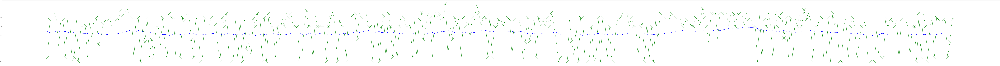

In [79]:
plt.rcParams['figure.figsize'] = [300, 20]
plt.plot(test_true,c='g',marker='x',markersize=50)
plt.plot(test_predictions, c='b',marker='o')
plt.show()